In [1]:
# This code for figure 10 - SST, SSS, MLD2 
# edited by EunByeol Cho 
# July 4 2024
# this code based on scaling_fig9.ipynb

In [8]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
#import pystuff as ps
import cartopy.crs as ccrs
import cartopy.feature as cf
import seaborn as sns
import matplotlib.patches as patches
from scipy import stats
import cmocean
import glob
from cmcrameri import cm
from tqdm.notebook import tqdm_notebook

In [9]:
import warnings
warnings.simplefilter(action='ignore')

In [10]:
# load variables at each periods 
mld2_lon = xr.open_dataset('/proj/shared_data/awicm3/TCo1279-DART-2000/outdata/fesom/MLD2_3600x1800/MLD2.fesom.2002_2012.nc')['lon']
mld2_lat = xr.open_dataset('/proj/shared_data/awicm3/TCo1279-DART-2000/outdata/fesom/MLD2_3600x1800/MLD2.fesom.2002_2012.nc')['lat']

mld2_2000 = xr.open_dataset('/proj/shared_data/awicm3/TCo1279-DART-2000/outdata/fesom/MLD2_3600x1800/MLD2.fesom.2002_2012.nc')['MLD2']
sst_2000 = xr.open_dataset('/proj/shared_data/awicm3/TCo1279-DART-2000/outdata/fesom/temp1-31_3600x1800/temp1-31.fesom.2002_2012.nc')['temp1-31']
# salt_2000 = xr.open_dataset('/proj/shared_data/awicm3/TCo1279-DART-2000/outdata/fesom/salt1-31_3600x1800/salt1-31.fesom.2002_2012.nc')['salt1-31']
sss_2000 = xr.open_dataset('/proj/shared_data/awicm3/TCo1279-DART-2000/outdata/fesom/sss_3600x1800/sss.fesom.2002_2012.nc')['sss']

mld2_2030 = xr.open_dataset('/proj/shared_data/awicm3/TCo1279-DART-2030/outdata/fesom/MLD2_3600x1800/MLD2.fesom.2032_2039.nc')['MLD2']
sst_2030 = xr.open_dataset('/proj/shared_data/awicm3/TCo1279-DART-2030/outdata/fesom/temp1-31_3600x1800/temp1-31.fesom.2032_2039.nc')['temp1-31']
# salt_2030 = xr.open_dataset('/proj/shared_data/awicm3/TCo1279-DART-2030/outdata/fesom/salt1-31_3600x1800/salt1-31.fesom.2032_2039.nc')['salt1-31']
sss_2030 = xr.open_dataset('/proj/shared_data/awicm3/TCo1279-DART-2030/outdata/fesom/sss_3600x1800/sss.fesom.2032_2039.nc')['sss']

mld2_2060 = xr.open_dataset('/proj/shared_data/awicm3/TCo1279-DART-2060/outdata/fesom/MLD2_3600x1800/MLD2.fesom.2062_2069.nc')['MLD2']
sst_2060 = xr.open_dataset('/proj/shared_data/awicm3/TCo1279-DART-2060/outdata/fesom/temp1-31_3600x1800/temp1-31.fesom.2062_2069.nc')['temp1-31']
# salt_2060 = xr.open_dataset('/proj/shared_data/awicm3/TCo1279-DART-2060/outdata/fesom/salt1-31_3600x1800/salt1-31.fesom.2062_2069.nc')['salt1-31']
sss_2060 = xr.open_dataset('/proj/shared_data/awicm3/TCo1279-DART-2060/outdata/fesom/sss_3600x1800/sss.fesom.2062_2069.nc')['sss']

mld2_2090 = xr.open_dataset('/proj/shared_data/awicm3/TCo1279-DART-2090/outdata/fesom/MLD2_3600x1800/MLD2.fesom.2092_2099.nc')['MLD2']
sst_2090 = xr.open_dataset('/proj/shared_data/awicm3/TCo1279-DART-2090/outdata/fesom/temp1-31_3600x1800/temp1-31.fesom.2092_2099.nc')['temp1-31']
# salt_2090 = xr.open_dataset('/proj/shared_data/awicm3/TCo1279-DART-2090/outdata/fesom/salt1-31_3600x1800/salt1-31.fesom.2092_2099.nc')['salt1-31']
sss_2090 = xr.open_dataset('/proj/shared_data/awicm3/TCo1279-DART-2090/outdata/fesom/sss_3600x1800/sss.fesom.2092_2099.nc')['sss']


In [11]:
# set surface
mld2_2090 = -mld2_2090.squeeze()
sst_2090 = sst_2090.squeeze()
sss_2090 = sss_2090.squeeze()

mld2_2060 = -mld2_2060.squeeze()
sst_2060 = sst_2060.squeeze()
sss_2060 = sss_2060.squeeze()

mld2_2030 = -mld2_2030.squeeze()
sst_2030 = sst_2030.squeeze()
sss_2030 = sss_2030.squeeze()

mld2_2000 = -mld2_2000.squeeze()
sst_2000 = sst_2000.squeeze()
sss_2000 = sss_2000.squeeze()


In [12]:
# Define the temperature differences
temp_diff1 = 1.00
temp_diff2 = 2.97
temp_diff3 = 4.99

In [13]:
# MLD2 signal normalized with respect to the defined global mean temperature changes
mld2_C1 = (mld2_2030 - mld2_2000) / temp_diff1
mld2_C2 = (mld2_2060 - mld2_2000) / temp_diff2
mld2_C3 = (mld2_2090 - mld2_2000) / temp_diff3

# sst signal normalized with respect to the defined global mean temperature changes
sst_C1 = (sst_2030 - sst_2000) / temp_diff1
sst_C2 = (sst_2060 - sst_2000) / temp_diff2
sst_C3 = (sst_2090 - sst_2000) / temp_diff3

# sss signal normalized with respect to the defined global mean temperature changes
sss_C1 = (sss_2030 - sss_2000) / temp_diff1
sss_C2 = (sss_2060 - sss_2000) / temp_diff2
sss_C3 = (sss_2090 - sss_2000) / temp_diff3


In [14]:
# scaling 
mld2_scaling = (mld2_C1 + mld2_C2 + mld2_C3)/3
sst_scaling = (sst_C1 + sst_C2 + sst_C3)/3
sss_scaling = (sss_C1 + sss_C2 + sss_C3)/3

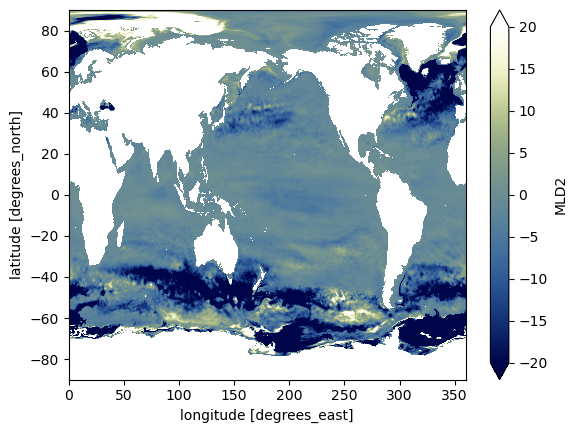

In [15]:
mld2_scaling.plot(cmap=cm.davos,vmax=20,vmin=-20)

  0%|          | 0/6 [00:00<?, ?it/s]

FileNotFoundError: [Errno 2] No such file or directory: '/mnt/lustre/proj/eunbyeol/Scripts/Fesom/Hackerton/fig10_sst_sss_mld2_EBCho2.png'

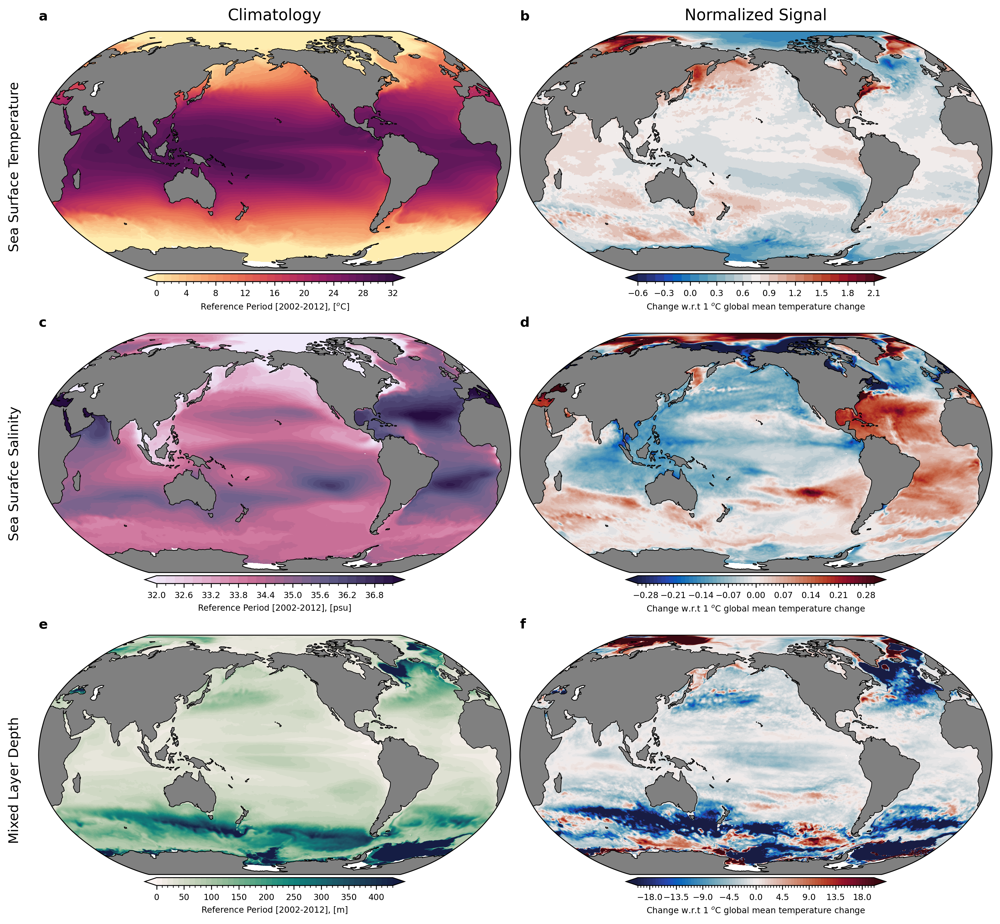

In [16]:
plt.rcParams.update({'font.size': 7.5})
fig,ax = plt.subplots(3,2,figsize=(18.5, 19), dpi=300, facecolor='w', edgecolor='k',subplot_kw={'projection': ccrs.Robinson(central_longitude=200)})

import cmocean
import matplotlib.colors as mcolors

titlesM = ['Climatology', 'Normalized Signal']
titlesL = ['$\mathbf{a}$', '$\mathbf{b}$', '$\mathbf{c}$', '$\mathbf{d}$', '$\mathbf{e}$', '$\mathbf{f}$']
labels = ['Sea Surface Temperature', 'Sea Surafce Salinity', 'Mixed Layer Depth']

fields=[sst_2000, sst_scaling,
        sss_2000, sss_scaling,
        mld2_2000, mld2_scaling]

levels=[np.arange(0,33,1), np.arange(-0.6,2.2,0.1),
        np.arange(32,37.2,0.2), np.arange(-0.3,0.31,0.01),
        np.arange(0,440,10), np.arange(-20,20.5,0.5)]

norms = [None, mcolors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=3),
         None, mcolors.TwoSlopeNorm(vmin=-0.6, vcenter=0, vmax=0.65),
         None, mcolors.TwoSlopeNorm(vmin=-1.0, vcenter=0, vmax=1.05)]

cbar=[cmocean.cm.matter, cmocean.cm.balance,
      cm.acton_r, cmocean.cm.balance,
      cmocean.cm.tempo, cmocean.cm.balance]

units=[ 'Reference Period [2002-2012], [$^{o}$C]', 'Change w.r.t 1 $^{o}$C global mean temperature change',
        'Reference Period [2002-2012], [psu]', 'Change w.r.t 1 $^{o}$C global mean temperature change', 
        'Reference Period [2002-2012], [m]', 'Change w.r.t 1 $^{o}$C global mean temperature change']

for i,a in enumerate(tqdm_notebook(ax.flat)) :
      clabel=('%s'%units[i])
      cbar_kwargs={'orientation':'horizontal','pad':0.01,'shrink':0.55, 'label':clabel, 'aspect':33}
      fields[i].plot.contourf(ax=a,transform=ccrs.PlateCarree(),levels=levels[i],cbar_kwargs=cbar_kwargs,cmap=cbar[i], extend='both')
    # fields[i].plot.contourf(ax=a,transform=ccrs.PlateCarree(),levels=levels[i],norm=norms[i], cbar_kwargs=cbar_kwargs,cmap=cbar[i], extend='both')
      
      a.add_feature(cf.LAND,color='grey')
      a.coastlines(linewidth=0.6,color='black')
      a.set_global()  

for i, label in enumerate(labels):
    fig.text(0.29, 0.86 - i * 0.20, label, transform=fig.transFigure, fontsize=12, va='center', ha='center', rotation=90)
        
for i, a in enumerate(ax.flat):
    a.set_title('%s' % titlesL[i], size=12, loc='left')

    if i <= 1:
        a.set_title('%s' % (titlesM[i]), size=14, y=1.0, pad=10)
    else:
        a.set_title('')
            
plt.tight_layout(rect=[0.3, 0.36, 0.95, 0.97])
# plt.savefig('/proj/eunbyeol/Scripts/Fesom/Hackerton/fig10_sst_sss_mld2_EBCho2.png',dpi=500, bbox_inches = 'tight')

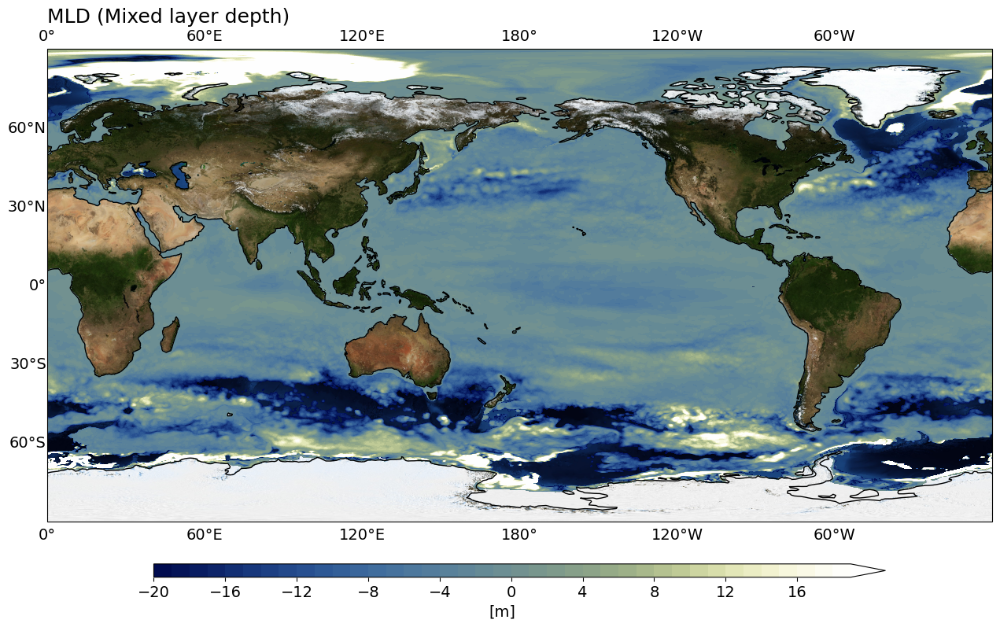

In [15]:
# plot with earth topography
# %%time
import matplotlib.image as mpimg
proj=ccrs.PlateCarree(central_longitude=180)
fig=plt.figure(figsize=(60,10))

ax=plt.subplot(111, projection=proj)
ax.add_feature(cf.LAND,linewidth=0.5, color='#C0C0C0')
ax.stock_img()
# ax.set_title('$\mathbf{b}$ Snapshot of Eddy Kinetic Energy', size= 18, loc='left')
ax.set_title('MLD (Mixed layer depth)', size= 18, loc='left')
ax.coastlines()
extent = [-180, 180, -90, 90]

#Add topography image
topo_image = mpimg.imread('/proj/eunbyeol/Scripts/Fesom/Hackathon/Script_python/world.topo.bathy.200409.3x5400x2700.jpg')
ax.imshow(topo_image, origin='upper', extent=extent, transform=ccrs.PlateCarree())

plt.contourf(mld2_lon, mld2_lat, mld2_scaling ,np.arange(-20,20,1), cmap=cm.davos, extend='max', transform=ccrs.PlateCarree())
# cbar=plt.colorbar(orientation="horizontal", pad=0.07, shrink=0.2,aspect=55)
cbar = plt.colorbar(orientation="horizontal", pad=0.07, shrink=0.2, aspect=55, extend='both')
cbar.set_label(label='[m]', size=14)
cbar.ax.tick_params(labelsize=14) 

a=ax.gridlines(draw_labels=True, crs=ccrs.PlateCarree(),alpha=0)
a.xlabels_top = False
a.xlabels_bottom = True
a.ylabels_left = True
a.ylabels_right = False
import matplotlib.ticker as mticker
a.ylabel_style = {'size': 14, 'color': 'black'}
a.xlabel_style = {'size': 14, 'color': 'black'}

# plt.savefig('/proj/eunbyeol/Scripts/Fesom/Hackerton/mld2_topo.png',dpi=500, bbox_inches = 'tight')

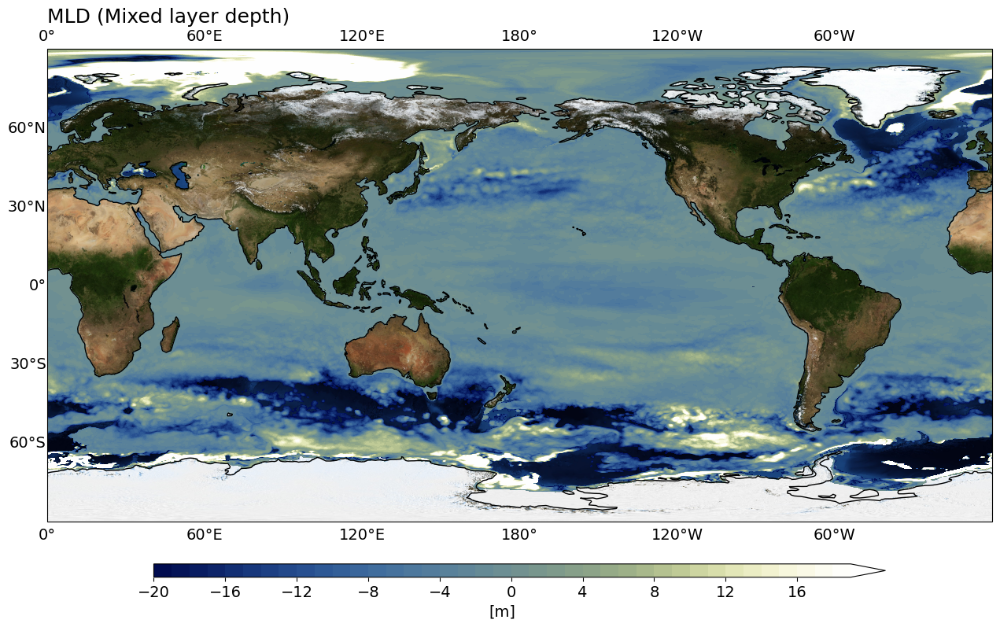

In [18]:
# plot with earth topography
# %%time
import matplotlib.image as mpimg
proj=ccrs.PlateCarree(central_longitude=180)
fig=plt.figure(figsize=(60,10))

ax=plt.subplot(111, projection=proj)
ax.add_feature(cf.LAND,linewidth=0.5, color='#C0C0C0')
ax.stock_img()
# ax.set_title('$\mathbf{b}$ Snapshot of Eddy Kinetic Energy', size= 18, loc='left')
ax.set_title('MLD (Mixed layer depth)', size= 18, loc='left')
ax.coastlines()
extent = [-180, 180, -90, 90]

#Add topography image
topo_image = mpimg.imread('/proj/eunbyeol/Scripts/Fesom/Hackathon/Script_python/world.topo.bathy.200409.3x5400x2700.jpg')
ax.imshow(topo_image, origin='upper', extent=extent, transform=ccrs.PlateCarree())

plt.contourf(mld2_lon, mld2_lat, mld2_scaling ,np.arange(-20,20,1), cmap=cm.davos, extend='max', transform=ccrs.PlateCarree())
# cbar=plt.colorbar(orientation="horizontal", pad=0.07, shrink=0.2,aspect=55)
cbar = plt.colorbar(orientation="horizontal", pad=0.07, shrink=0.2, aspect=55, extend='both')
cbar.set_label(label='[m]', size=14)
cbar.ax.tick_params(labelsize=14) 

a=ax.gridlines(draw_labels=True, crs=ccrs.PlateCarree(),alpha=0)
a.xlabels_top = False
a.xlabels_bottom = True
a.ylabels_left = True
a.ylabels_right = False
import matplotlib.ticker as mticker
a.ylabel_style = {'size': 14, 'color': 'black'}
a.xlabel_style = {'size': 14, 'color': 'black'}

# plt.savefig('/proj/eunbyeol/Scripts/Fesom/Hackerton/mld2_topo.png',dpi=500, bbox_inches = 'tight')

  0%|          | 0/6 [00:00<?, ?it/s]

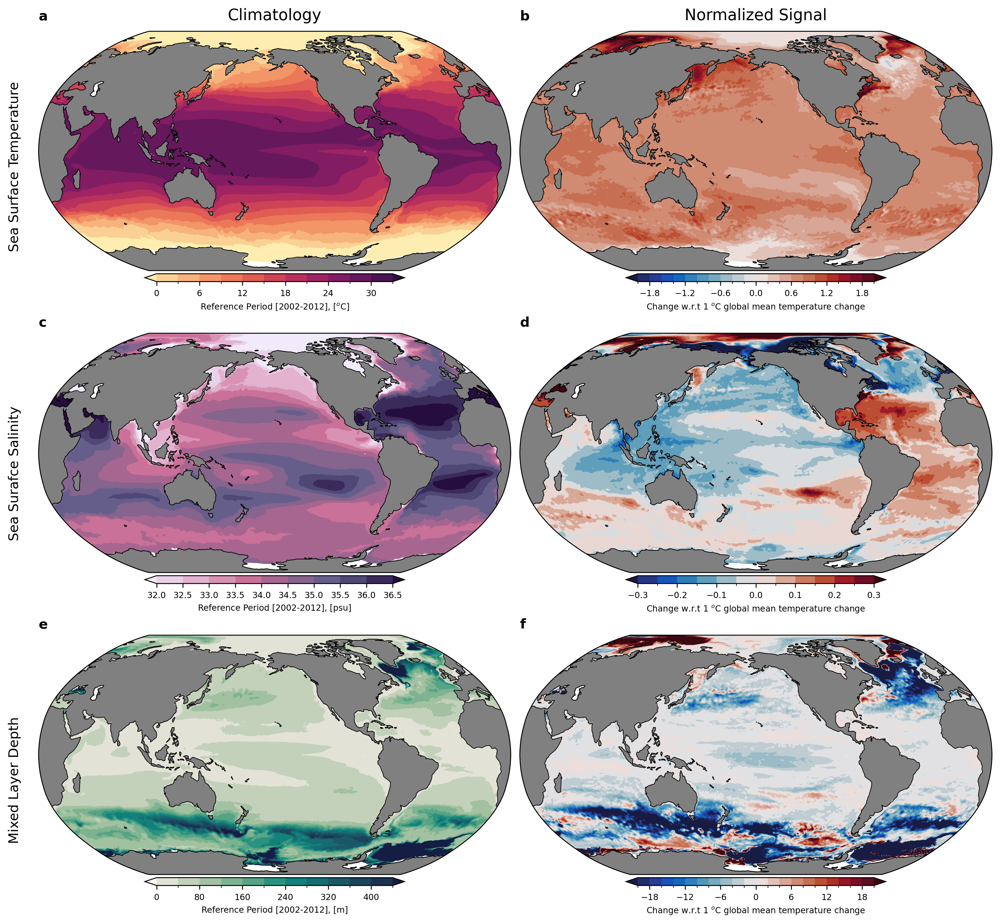

In [13]:
plt.rcParams.update({'font.size': 7.5})
fig,ax = plt.subplots(3,2,figsize=(18.5, 19), dpi=300, facecolor='w', edgecolor='k',subplot_kw={'projection': ccrs.Robinson(central_longitude=200)})

import cmocean
import matplotlib.colors as mcolors

titlesM = ['Climatology', 'Normalized Signal']
titlesL = ['$\mathbf{a}$', '$\mathbf{b}$', '$\mathbf{c}$', '$\mathbf{d}$', '$\mathbf{e}$', '$\mathbf{f}$']
labels = ['Sea Surface Temperature', 'Sea Surafce Salinity', 'Mixed Layer Depth']

fields=[sst_2000, sst_scaling,
        sss_2000, sss_scaling,
        mld2_2000, mld2_scaling]

levels=[np.arange(0,33,3), np.arange(-0.6,2.2,0.2),
        np.arange(32,37.5,0.5), np.arange(-0.3,0.33,0.03),
        np.arange(0,440,40), np.arange(-20,22,2)]

norms = [None, mcolors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=3),
         None, mcolors.TwoSlopeNorm(vmin=-0.6, vcenter=0, vmax=0.65),
         None, mcolors.TwoSlopeNorm(vmin=-1.0, vcenter=0, vmax=1.05)]

cbar=[cmocean.cm.matter, cmocean.cm.balance,
      cm.acton_r, cmocean.cm.balance,
      cmocean.cm.tempo, cmocean.cm.balance]

units=[ 'Reference Period [2002-2012], [$^{o}$C]', 'Change w.r.t 1 $^{o}$C global mean temperature change',
        'Reference Period [2002-2012], [psu]', 'Change w.r.t 1 $^{o}$C global mean temperature change', 
        'Reference Period [2002-2012], [m]', 'Change w.r.t 1 $^{o}$C global mean temperature change']

for i,a in enumerate(tqdm_notebook(ax.flat)) :
      clabel=('%s'%units[i])
      cbar_kwargs={'orientation':'horizontal','pad':0.01,'shrink':0.55, 'label':clabel, 'aspect':33}
      fields[i].plot.contourf(ax=a,transform=ccrs.PlateCarree(),levels=levels[i],cbar_kwargs=cbar_kwargs,cmap=cbar[i], extend='both')
    # fields[i].plot.contourf(ax=a,transform=ccrs.PlateCarree(),levels=levels[i],norm=norms[i], cbar_kwargs=cbar_kwargs,cmap=cbar[i], extend='both')
      
      a.add_feature(cf.LAND,color='grey')
      a.coastlines(linewidth=0.6,color='black')
      a.set_global()  

for i, label in enumerate(labels):
    fig.text(0.29, 0.86 - i * 0.20, label, transform=fig.transFigure, fontsize=12, va='center', ha='center', rotation=90)
        
for i, a in enumerate(ax.flat):
    a.set_title('%s' % titlesL[i], size=12, loc='left')

    if i <= 1:
        a.set_title('%s' % (titlesM[i]), size=14, y=1.0, pad=10)
    else:
        a.set_title('')
            
plt.tight_layout(rect=[0.3, 0.36, 0.95, 0.97])
plt.savefig('/proj/eunbyeol/Scripts/Fesom/Hackerton/fig10_sst_sss_mld2_EBCho2.png',dpi=500, bbox_inches = 'tight')

In [1]:
plt.rcParams.update({'font.size': 7.5})
fig,ax = plt.subplots(3,2,figsize=(18.5, 19), dpi=300, facecolor='w', edgecolor='k',subplot_kw={'projection': ccrs.Robinson(central_longitude=200)})

import cmocean

titlesM = ['Climatology', 'Normalized Signal']
titlesL = ['$\mathbf{a}$', '$\mathbf{b}$', '$\mathbf{c}$', '$\mathbf{d}$', '$\mathbf{e}$', '$\mathbf{f}$']
labels = ['Sea Surface Temperature', 'Sea Surafce Salinity', 'Mixed Layer Depth']

fields=[sst_2000, sst_scaling,
        sss_2000, sss_scaling,
        mld2_2000, mld2_scaling]

levels=[np.arange(0,33,3), np.arange(-2,2.2,0.2),
        np.arange(32,37.5,0.5), np.arange(-0.3,0.33,0.03),
        np.arange(0,440,40), np.arange(-20,22,2)]

cbar=[cmocean.cm.matter, cmocean.cm.balance,
      cm.acton_r, cmocean.cm.balance,
      cmocean.cm.tempo, cmocean.cm.balance]

# cbar = [cmocean.cm.matter, cmocean.cm.balance,
#         cmocean.cm.amp, cmocean.cm.balance,
#         cmocean.cm.deep, cmocean.cm.balance]

units=[ 'Reference Period [2002-2012], [$^{o}$C]', 'Change w.r.t 1 $^{o}$C global mean temperature change',
        'Reference Period [2002-2012], [psu]', 'Change w.r.t 1 $^{o}$C global mean temperature change', 
        'Reference Period [2002-2012], [m]', 'Change w.r.t 1 $^{o}$C global mean temperature change']

for i,a in enumerate(tqdm_notebook(ax.flat)) :
      clabel=('%s'%units[i])
      cbar_kwargs={'orientation':'horizontal','pad':0.01,'shrink':0.55, 'label':clabel, 'aspect':33}
      fields[i].plot.contourf(ax=a,transform=ccrs.PlateCarree(),levels=levels[i],cbar_kwargs=cbar_kwargs,cmap=cbar[i], extend='both')

      a.add_feature(cf.LAND,color='grey')
      a.coastlines(linewidth=0.6,color='black')
      a.set_global()  

for i, label in enumerate(labels):
    fig.text(0.29, 0.86 - i * 0.20, label, transform=fig.transFigure, fontsize=12, va='center', ha='center', rotation=90)
        
for i, a in enumerate(ax.flat):
    a.set_title('%s' % titlesL[i], size=12, loc='left')

    if i <= 1:
        a.set_title('%s' % (titlesM[i]), size=14, y=1.0, pad=10)
    else:
        a.set_title('')
            
plt.tight_layout(rect=[0.3, 0.36, 0.95, 0.97])
plt.savefig('/proj/eunbyeol/Scripts/Fesom/Hackerton/fig10_sst_sss_mld2_EBCho2.png',dpi=500, bbox_inches = 'tight')

<>:7: SyntaxWarning: invalid escape sequence '\m'
<>:7: SyntaxWarning: invalid escape sequence '\m'
<>:7: SyntaxWarning: invalid escape sequence '\m'
<>:7: SyntaxWarning: invalid escape sequence '\m'
<>:7: SyntaxWarning: invalid escape sequence '\m'
<>:7: SyntaxWarning: invalid escape sequence '\m'
<>:7: SyntaxWarning: invalid escape sequence '\m'
<>:7: SyntaxWarning: invalid escape sequence '\m'
<>:7: SyntaxWarning: invalid escape sequence '\m'
<>:7: SyntaxWarning: invalid escape sequence '\m'
<>:7: SyntaxWarning: invalid escape sequence '\m'
<>:7: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_62847/4070412999.py:7: SyntaxWarning: invalid escape sequence '\m'
  titlesL = ['$\mathbf{a}$', '$\mathbf{b}$', '$\mathbf{c}$', '$\mathbf{d}$', '$\mathbf{e}$', '$\mathbf{f}$']
/tmp/ipykernel_62847/4070412999.py:7: SyntaxWarning: invalid escape sequence '\m'
  titlesL = ['$\mathbf{a}$', '$\mathbf{b}$', '$\mathbf{c}$', '$\mathbf{d}$', '$\mathbf{e}$', '$\mathbf{f}$']
/tmp/ipykernel_628

NameError: name 'plt' is not defined